# Pregunta 1 — Saturación selectiva de color

### Importaciones necesarias

In [1]:
import numpy as np
import os
import matplotlib.pyplot as plt
import skimage as sk

## Implementación

### Interpolación periódica de `m(h)`

La función ordena los puntos de control según el tono `h`, extiende los extremos para respetar la circularidad del tono y calcula `m(h)` mediante interpolación lineal. Finalmente, normaliza los valores de `h` al intervalo `[0, 360)`.

In [2]:
def interpolate_m(h, ptos_control):
    # Ordenar los puntos de control por el valor de h
    ptos_control = sorted(ptos_control, key=lambda x: x[0])

    h_vals = np.array([p[0] for p in ptos_control])
    m_vals = np.array([p[1] for p in ptos_control])
    # exteder valores extremos para interpolación circular (periodicidad)
    h_p = np.concatenate(([h_vals[-1] - 360], h_vals, [h_vals[0] + 360]))
    m_p = np.concatenate(([m_vals[-1]], m_vals, [m_vals[0]]))

    # modular h para que esté en el rango [0, 360)
    h = np.mod(h, 360)
    # Interpolación
    return np.interp(h, h_p, m_p)

### Función `g_m`

Multiplica el componente `X` por `m(h)` y limita el resultado al rango válido `[0, max_val]`.

In [3]:
def g_m(X, m_h, max_val:float = 1.0):
    # asegurar que el componente esté en el rango [0, max_val]
    return np.clip(X * m_h, 0, max_val)

### Saturación selectiva

Convierte la imagen a HSV o CIE L\*C\*h\*, modifica su saturación o croma mediante `m(h)` y reconstruye la imagen RGB.

In [4]:
def color_saturation(img: np.ndarray, ptos_control: list, mode='HS'):

    img = img.copy().astype(np.float64)
    img = img / 255.0

    if mode == 'HS':
        # Conversión a HSV
        # H, S, V = rgb_to_hsv(img)
        hsv = sk.color.rgb2hsv(img)
        H = hsv[:, :, 0] * 360.0  # Convertir a grados
        S = hsv[:, :, 1]
        V = hsv[:, :, 2]
        # Modificación de S con m(h)
        m_h = interpolate_m(H, ptos_control)
        # Modificación de S con m(h)
        S_prima = g_m(S, m_h)

        # Reconstrucción de la imagen a RGB
        # return hsv_to_rgb(H, S_prima, V)
        hsv_prima = np.stack((H / 360.0, S_prima, V), axis=-1)
        return np.clip(sk.color.hsv2rgb(hsv_prima) * 255, 0, 255).astype(np.uint8)
    
    elif mode == 'CIE':
        # Conversión a CIE lch
        lab = sk.color.rgb2lab(img)
        L = lab[:, :, 0]
        a = lab[:, :, 1]
        b = lab[:, :, 2]
        C = np.sqrt(a**2 + b**2)
        h = np.degrees(np.arctan2(b, a)) % 360

        # interpolación de m(h)
        m_h = interpolate_m(h, ptos_control)
        # Modificación de C con m(h)
        C_prima = g_m(C, m_h, max_val=None)

        # Reconstrucción de la imagen a RGB
        a_prima = C_prima * np.cos(np.radians(h))
        b_prima = C_prima * np.sin(np.radians(h))
        lab_prima = np.stack((L, a_prima, b_prima), axis=-1)
        return np.clip(sk.color.lab2rgb(lab_prima) * 255, 0, 255).astype(np.uint8)

## Análisis y exploración

In [5]:
# Configuración de figuras
plt.rcParams['figure.dpi'] = 120
plt.rcParams['font.size'] = 10
os.makedirs('results', exist_ok=True)

# Cargar dos imágenes RGB con características cromáticas distintas
# 1. Loros con baja saturación de color y tonos fríos dominantes
# 2. coffe de skimage con alta saturación de color y tonos cálidos dominantes
img_rgb_1 = sk.io.imread('data/P1_IMG_2402.tif')
# img_rgb_2 = sk.io.imread('data/P1_colorida.jpg')
img_rgb_2 = sk.data.coffee()  # Imagen de ejemplo de skimage

### 1) Configuraciones de puntos de control curvas m(h)

In [6]:
# Configuración 1: aumentar tonos verdes y azules (H ~ 120° - 240°)
config_1 = [
    (0, 1.0), (80, 1.0),
    (110, 1.8), (150, 2.0),
    (210, 1.8), (260, 1.8),
    (290, 1.0), (360, 1.0)
]
# Configuración 2: atenuar tonos rojos
config_2 = [
    (0, 0.2), (30, 0.2),
    (60, 1.0), (300, 1.0),
    (330, 0.2), (360, 0.2)
]

# Configuración 3: Mixta (Amplifica fuertemente amarillos, verdes y azules / Atenúa rojos y naranjas)
config_3 = [
    (0, 0.60),     # Rojo: atenuar al 60%
    (30, 0.70),    # Naranja: atenuar al 70%
    (60, 2.20),    # Amarillo: gran amplificación (220%)
    (120, 2.50),   # Verde: amplificación máxima (250%)
    (180, 1.80),   # Cian: amplificación intermedia (180%)
    (240, 2.20),   # Azul: gran amplificación (220%)
    (300, 1.00),   # Magenta: neutro (100%)
    (330, 0.70),   # Rojo-púrpura: atenuar al 70%
    (360, 0.60)    # Cierre periódico en rojo (60%)
]

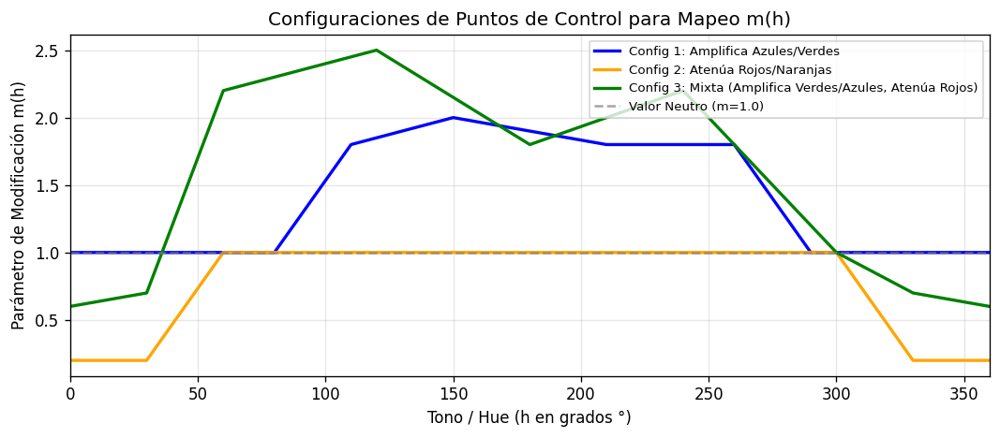

In [25]:
# Graficar las 3 funciones m(h) interpoladas
h = np.linspace(0, 360, 361)

fig, ax = plt.subplots(figsize=(9, 4))
ax.plot(h, interpolate_m(h, config_1), label='Config 1: Amplifica Azules/Verdes', color='blue', lw=2)
ax.plot(h, interpolate_m(h, config_2), label='Config 2: Atenúa Rojos/Naranjas', color='orange', lw=2)
ax.plot(h, interpolate_m(h, config_3), label='Config 3: Mixta (Amplifica Verdes/Azules, Atenúa Rojos)', color='g', lw=2)

ax.axhline(1.0, color='gray', linestyle='--', alpha=0.7, label='Valor Neutro (m=1.0)')
ax.set_xlabel('Tono / Hue (h en grados °)')
ax.set_ylabel('Parámetro de Modificación m(h)')
ax.set_title('Configuraciones de Puntos de Control para Mapeo m(h)')
ax.set_xlim(0, 360)
ax.grid(True, alpha=0.3)
ax.legend(loc='upper right', fontsize=8)

os.makedirs(os.path.join('results', 'p1'), exist_ok=True)
plt.tight_layout()
plt.savefig(
    os.path.join('results', 'p1', 'curvas_m_h.png'),
    dpi=300,
    bbox_inches='tight'
)
plt.show()

## 2) Aplicación configuraciones

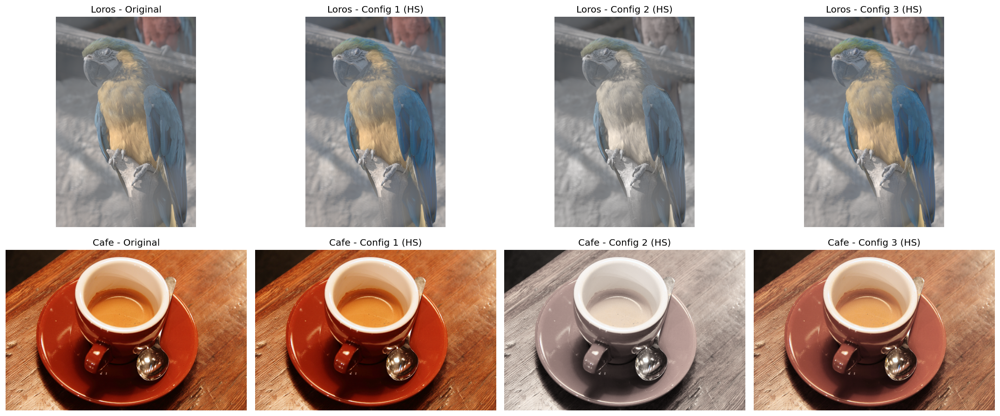

In [8]:
fig, axes = plt.subplots(2, 4, figsize=(18, 8))

# Imagen 1: Loros con baja saturación de color y tonos fríos dominantes
axes[0, 0].imshow(img_rgb_1); axes[0, 0].set_title('Loros - Original'); axes[0, 0].axis('off')
axes[0, 1].imshow(color_saturation(img_rgb_1, config_1, mode='HS')); axes[0, 1].set_title('Loros - Config 1 (HS)'); axes[0, 1].axis('off')
axes[0, 2].imshow(color_saturation(img_rgb_1, config_2, mode='HS')); axes[0, 2].set_title('Loros - Config 2 (HS)'); axes[0, 2].axis('off')
axes[0, 3].imshow(color_saturation(img_rgb_1, config_3, mode='HS')); axes[0, 3].set_title('Loros - Config 3 (HS)'); axes[0, 3].axis('off')

# Imagen 2: Perro con chaleco colorido
axes[1, 0].imshow(img_rgb_2); axes[1, 0].set_title('Cafe - Original'); axes[1, 0].axis('off')
axes[1, 1].imshow(color_saturation(img_rgb_2, config_1, mode='HS')); axes[1, 1].set_title('Cafe - Config 1 (HS)'); axes[1, 1].axis('off')
axes[1, 2].imshow(color_saturation(img_rgb_2, config_2, mode='HS')); axes[1, 2].set_title('Cafe - Config 2 (HS)'); axes[1, 2].axis('off')
axes[1, 3].imshow(color_saturation(img_rgb_2, config_3, mode='HS')); axes[1, 3].set_title('Cafe - Config 3 (HS)'); axes[1, 3].axis('off')

plt.tight_layout()
plt.savefig(
    os.path.join('results', 'p1', 'aplicacion_configuraciones.png'),
    dpi=300,
    bbox_inches='tight'
)
plt.show()

### 3) Comparación HSV vs L\*c\*h*

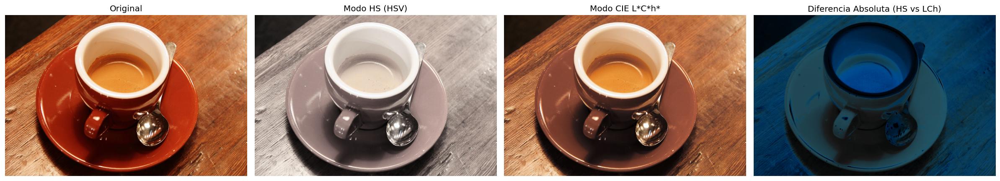

In [9]:
# Aplicar Configuración 2 en ambos espacios de color
res_hs = color_saturation(img_rgb_2, config_2, mode='HS')
res_lch = color_saturation(img_rgb_2, config_2, mode='CIE')

# Diferencia absoluta visual entre modos
diff_visual = np.abs(res_hs.astype(np.float64) - res_lch.astype(np.float64)) / 255.0

fig, axes = plt.subplots(1, 4, figsize=(20, 5))
axes[0].imshow(img_rgb_2); axes[0].set_title('Original'); axes[0].axis('off')
axes[1].imshow(res_hs); axes[1].set_title('Modo HS (HSV)'); axes[1].axis('off')
axes[2].imshow(res_lch); axes[2].set_title('Modo CIE L*C*h*'); axes[2].axis('off')
axes[3].imshow(diff_visual); axes[3].set_title('Diferencia Absoluta (HS vs LCh)'); axes[3].axis('off')

plt.tight_layout()
plt.savefig(
    os.path.join('results', 'p1', 'hsv_vs_lch.png'),
    dpi=300,
    bbox_inches='tight'
)
plt.show()

**1. Análisis de la Imagen Original y Configuración Aplicada**
* **Imagen de prueba:** La imagen original presenta un claro predominio de tonos cálidos (rojos, anaranjados y marrones).
* **Configuración utilizada (Configuración 2):** Se aplicó una curva de atenuación sobre el intervalo cromático del rojo $(H \in [0^\circ, 40^\circ] \cup [320^\circ, 360^\circ])$, reduciendo la saturación/croma a un factor de $m(h) \approx 0.2$ (20% del valor original).

**2. Comportamiento en el Modo HSV**
* **Observación:** La imagen procesada en modo **HSV** se observa fuertemente desaturada, adquiriendo un aspecto predominantemente gris y acromático en el plato y la madera.
* **Causa matemática:** En el modelo HSV, la saturación se calcula como $S_{HSV} = \frac{\Delta}{C_{\max}} = 1 - \frac{\min(R,G,B)}{\max(R,G,B)}$. Al reducir $S$ hacia cero, las componentes RGB son forzadas a colapsar directamente hacia el valor de brillo $V = \max(R,G,B)$. Esto provoca que las regiones atenuadas pierdan abruptamente su intensidad y se conviertan en escala de grises.

**3. Comportamiento en el Modo CIE $L^*c^*h^*$**
* **Observación:** Al aplicar exactamente el mismo mapeo ($m(h)$) en el espacio **CIE $L^*c^*h^*$**, la imagen no se desatura de forma tan drástica. Mantiene un tono cálido cafe un poco más frio que el original, evitando el colapso al gris plano del modo HSV.
* **Causa matemática:** En **CIE $L^*c^*h^*$**, la componente de croma $(c^* = \sqrt{(a^*)^2 + (b^*)^2})$ representa la distancia euclidiana en el plano de cromaticidad ortogonal $(a^*b^*)$. Al escalar $(c^*)$, las componentes $(a^*)$ y $(b^*)$ se comprimen hacia el origen. Y se conservan pequeños matices cromáticos que el ojo humano sigue percibiendo como un tono cálido natural o cafe.

**4. Análisis de la Diferencia Absoluta**
* **Zonas de mayor discrepancia:** Las mayores diferencias se concentran en las áreas donde el rojo era el color dominante (zonas blancas y negras no muestran cambios).
* Mientras que HSV altera la cromaticidad forzando los canales hacia el nivel de brillo $(V)$, CIE $L^*c^*h^*$ preserva la luminancia perceptual (L). Esto demuestra que CIE $L^*c^*h^*$  produce una atenuación de color más suave, progresiva y fiel a la percepción humana.

### 4) Exploración de parametros (cambios con g_m)

In [10]:
# Configuraciones
config_suave = [
    (0, 1.0), 
    (20, 1.2), 
    (45, 2.5),   # Pico principal en la zona amarillo-naranja
    (65, 2.5), 
    (90, 1.0),   # Transición suave hacia tonos verdes
    (360, 1.0)
]

config_abrupta = [
    (0, 1.0), 
    (50, 1.0), 
    (56, 1.0), 
    (59, 8.0),   # Salto abrupto en amarillo
    (62, 1.0), 
    (360, 1.0)
]

config_extrema = [
    (0, 1.0), 
    (25, 12.0),
    (65, 12.0),
    (100, 1.0), 
    (360, 1.0)
]

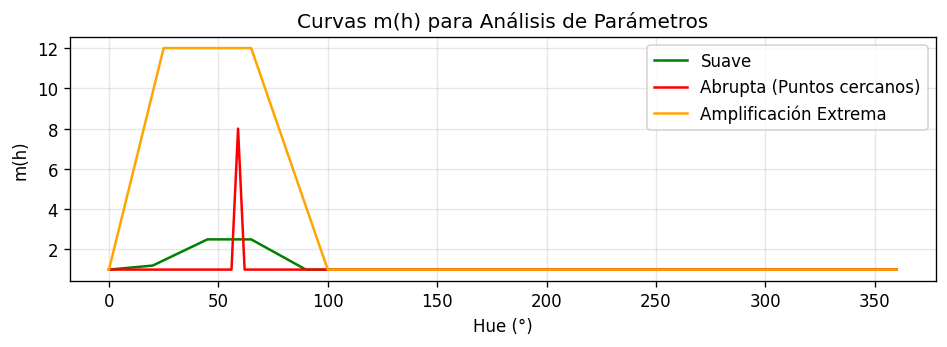

In [11]:
# Graficar las curvas m(h)
h_dom = np.linspace(0, 360, 361)
fig, ax = plt.subplots(figsize=(8, 3))
ax.plot(h_dom, interpolate_m(h_dom, config_suave), label='Suave', color='green')
ax.plot(h_dom, interpolate_m(h_dom, config_abrupta), label='Abrupta (Puntos cercanos)', color='red')
ax.plot(h_dom, interpolate_m(h_dom, config_extrema), label='Amplificación Extrema', color='orange')
ax.set_title('Curvas m(h) para Análisis de Parámetros')
ax.set_xlabel('Hue (°)')
ax.set_ylabel('m(h)')
ax.grid(True, alpha=0.3)
ax.legend()
plt.tight_layout()

plt.savefig(
    os.path.join('results', 'p1', 'curvas_parametros.png'),
    dpi=300,
    bbox_inches='tight'
)
plt.show()

C:\Users\apfib\AppData\Local\Temp\ipykernel_24908\3222826214.py:41: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 5 negative Z values that have been clipped to zero
  return np.clip(sk.color.lab2rgb(lab_prima) * 255, 0, 255).astype(np.uint8)
C:\Users\apfib\AppData\Local\Temp\ipykernel_24908\3222826214.py:41: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 1023015 negative Z values that have been clipped to zero
  return np.clip(sk.color.lab2rgb(lab_prima) * 255, 0, 255).astype(np.uint8)


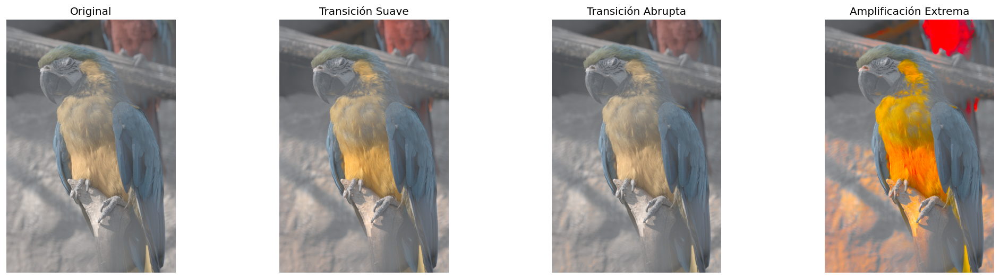

In [12]:
# Aplicar sobre la imagen 1 y mostrar resultados
res_suave = color_saturation(img_rgb_1, config_suave, mode='CIE')
res_abrupta = color_saturation(img_rgb_1, config_abrupta, mode='CIE')
res_extrema = color_saturation(img_rgb_1, config_extrema, mode='CIE')

fig, axes = plt.subplots(1, 4, figsize=(18, 4.5))
axes[0].imshow(img_rgb_1); axes[0].set_title('Original'); axes[0].axis('off')
axes[1].imshow(res_suave); axes[1].set_title('Transición Suave'); axes[1].axis('off')
axes[2].imshow(res_abrupta); axes[2].set_title('Transición Abrupta'); axes[2].axis('off')
axes[3].imshow(res_extrema); axes[3].set_title('Amplificación Extrema'); axes[3].axis('off')

plt.tight_layout()
plt.savefig(
    os.path.join('results', 'p1', 'loro_parametros.png'),
    dpi=300,
    bbox_inches='tight'
)
plt.show()

C:\Users\apfib\AppData\Local\Temp\ipykernel_24908\3222826214.py:41: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 70815 negative Z values that have been clipped to zero
  return np.clip(sk.color.lab2rgb(lab_prima) * 255, 0, 255).astype(np.uint8)
C:\Users\apfib\AppData\Local\Temp\ipykernel_24908\3222826214.py:41: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 23038 negative Z values that have been clipped to zero
  return np.clip(sk.color.lab2rgb(lab_prima) * 255, 0, 255).astype(np.uint8)
C:\Users\apfib\AppData\Local\Temp\ipykernel_24908\3222826214.py:41: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 225453 negative Z values that have been clipped to zero
  return np.clip(sk.color.lab2rgb(lab_prima) * 255, 0, 255).astype(np.uint8)


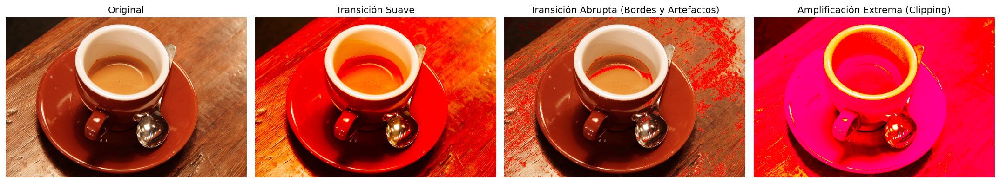

In [13]:
# Aplicar sobre la imagen 2 y mostrar resultados
res_suave_2 = color_saturation(img_rgb_2, config_suave, mode='CIE')
res_abrupta_2 = color_saturation(img_rgb_2, config_abrupta, mode='CIE')
res_extrema_2 = color_saturation(img_rgb_2, config_extrema, mode='CIE')

fig, axes = plt.subplots(1, 4, figsize=(18, 4.5))

axes[0].imshow(img_rgb_2)
axes[0].set_title('Original')
axes[0].axis('off')

axes[1].imshow(res_suave_2)
axes[1].set_title('Transición Suave')
axes[1].axis('off')

axes[2].imshow(res_abrupta_2)
axes[2].set_title('Transición Abrupta (Bordes y Artefactos)')
axes[2].axis('off')

axes[3].imshow(res_extrema_2)
axes[3].set_title('Amplificación Extrema (Clipping)')
axes[3].axis('off')

plt.tight_layout()
plt.savefig(
    os.path.join('results', 'p1', 'cafe_parametros.png'),
    dpi=300,
    bbox_inches='tight'
)
plt.show()

Para estudiar el efecto de la amplitud, el rango y la separación de los puntos de control, se compararon tres configuraciones de $m(h)$.

**1. Configuración suave:**

- Utiliza valores moderados, con un máximo de $m=2.5$.
- La transición se distribuye progresivamente entre los tonos naranja y amarillo.
- Produce cambios naturales y conserva las texturas de la imagen.
- Evita la aparición de bordes falsos y artefactos visibles.

**2. Configuración abrupta:**

- Concentra un cambio elevado, desde $m=1$ hasta $m=8$, en un intervalo aproximado de $3^\circ$.
- Afecta únicamente a un grupo reducido de tonos muy cercanos.
- Puede generar manchas, halos y contornos falsos.
- Las variaciones pequeñas de tono entre píxeles vecinos producen cambios grandes en la saturación.

**3. Configuración extrema:**

- Mantiene un valor elevado de $m=12$ en un rango amplio de tonos rojizos y amarillos.
- Produce una amplificación excesiva de la saturación o la croma.
- Puede provocar clipping al reconvertir la imagen al espacio RGB.
- Como consecuencia, se pierden detalles y texturas en las zonas más saturadas.

**Resultados en la imagen del loro**

La configuración suave aumenta moderadamente los tonos amarillos del plumaje y con una apariencia natural.

La configuración abrupta produce cambios poco visibles, ya que el intervalo afectado contiene pocos píxeles relevantes.

La configuración extrema intensifica los tonos amarillos del plumaje sin perder detalle y genera halos amarillos y rojos donde habia iluminación en el fondo, pero también genera clipping y pérdida de textura en las regiones rojas (plumaje).

**Resultados en la imagen del café**

La configuración suave aumenta los tonos rojizos y amarillentos de la madera y del café perdiendo un poco de detalles en la textura de la madera al quedar bastante saturada en rojo dado que la imagen original ya tenía una saturación rojiza.

La configuración abrupta produce modificaciones localizadas, con manchas rojizas y contornos falsos rojos. Ademas de una apariencia más "aplanada" como de caricatura/comic

La configuración extrema genera una sobresaturación evidente. Las zonas pierden sus variaciones de color y se convierten en regiones planas rojas/rosas debido al clipping.


La calidad visual depende de la amplitud de $m(h)$ y de la rápidez con que cambia respecto al tono. Las transiciones suaves producen resultados más naturales, mientras que los cambios bruscos o los valores muy altos pueden generar artefactos y pérdida de información.

### 5) Configuración extrema

C:\Users\apfib\AppData\Local\Temp\ipykernel_24908\3222826214.py:41: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 1079745 negative Z values that have been clipped to zero
  return np.clip(sk.color.lab2rgb(lab_prima) * 255, 0, 255).astype(np.uint8)


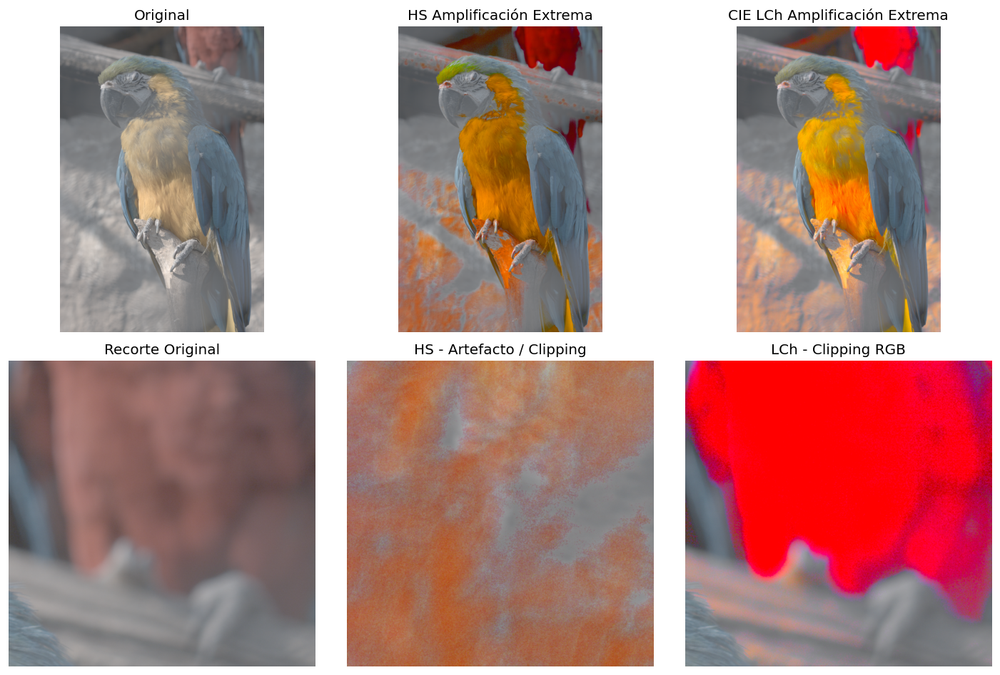

In [14]:
# Configuración extrema para forzar clipping (m = 12.0 en tonos rojos)
config_extrema = [
    (0, 12.0), 
    (60, 12.0), 
    (110, 1.0), 
    (290, 1.0), 
    (330, 12.0), 
    (360, 12.0)
]

res_hs_clip = color_saturation(img_rgb_1, config_extrema, mode='HS')
res_lch_clip = color_saturation(img_rgb_1, config_extrema, mode='CIE')

# Recorte ampliado
crop_y, crop_x = slice(0, 1000), slice(2000, 3000)
crop_y_1, crop_x_1 = slice(4000, 5000), slice(0, 1000)

fig, axes = plt.subplots(2, 3, figsize=(12, 8))

axes[0, 0].imshow(img_rgb_1); axes[0, 0].set_title('Original'); axes[0, 0].axis('off')
axes[0, 1].imshow(res_hs_clip); axes[0, 1].set_title('HS Amplificación Extrema'); axes[0, 1].axis('off')
axes[0, 2].imshow(res_lch_clip); axes[0, 2].set_title('CIE LCh Amplificación Extrema'); axes[0, 2].axis('off')

axes[1, 0].imshow(img_rgb_1[crop_y, crop_x]); axes[1, 0].set_title('Recorte Original'); axes[1, 0].axis('off')
axes[1, 1].imshow(res_hs_clip[crop_y_1, crop_x_1]); axes[1, 1].set_title('HS - Artefacto / Clipping'); axes[1, 1].axis('off')
axes[1, 2].imshow(res_lch_clip[crop_y, crop_x]); axes[1, 2].set_title('LCh - Clipping RGB'); axes[1, 2].axis('off')

plt.tight_layout()
plt.savefig(
    os.path.join('results', 'p1', 'caso_extremo_loro.png'),
    dpi=300,
    bbox_inches='tight'
)
plt.show()

Se aplicacó una amplificación extrema ($m = 12$) sobre la franja cromática del rojo.

**1. Observaciones en Modo HS**
* **Efecto observado:** Producción de artefactos y manchas falsas de color amarillo o rojo sobre zonas neutras o grises (como las áreas iluminadas de las piedras y el palo).
* En el modelo HS, al multiplicar la saturación $S$ por un factor alto ($m=12$), pequeños remanentes de cromaticidad no nula en zonas de altas luces o tonos grises se amplifican drásticamente hasta alcanzar el límite $S=1.0$. Al reconvertir a RGB, estos píxeles neutros colapsan hacia colores saturados falsos, creando manchas visibles.


**2. Observaciones en Modo CIE $L^*c^*h^*$**
* **Efecto observado:** Pérdida total de textura y detalle cromático en zonas rojas (el plumaje), transformándose en una superficie plana de color rojo vibrante e hiperintenso (efecto tipo "neón").
* En CIE $L^*c^*h^*$, la croma $c^*$ no posee un límite superior rígido dentro de la función $g_m$ [3]. Al escalar $c^*$ por $m=12$, los valores resultantes exceden ampliamente la gama representable por el espacio RGB. Al realizar la reconversión a RGB, la función de truncamiento/clipping satura las componentes al máximo permitido ($255$), aplanando la región y destruyendo las sombras y variaciones cromáticas originales.

### 6) Exploración adicional

In [ ]:
def g_m_suave(X, m_h):
    """
    Amplificación no lineal de X mediante m(h).
    Mantiene el valor dentro del rango [0, 1]
    sin aplicar clipping abrupto.
    """
    return (X * m_h) / (1 + X * (m_h - 1))

def color_saturation2(img: np.ndarray, ptos_control: list, mode='HS'):

    img = img.copy().astype(np.float64)
    img = img / 255.0

    if mode == 'HS':
        # Conversión a HSV
        # H, S, V = rgb_to_hsv(img)
        hsv = sk.color.rgb2hsv(img)
        H = hsv[:, :, 0] * 360.0  # Convertir a grados
        S = hsv[:, :, 1]
        V = hsv[:, :, 2]
        # Modificación de S con m(h)
        m_h = interpolate_m(H, ptos_control)
        # Modificación de S con m(h)
        S_prima = g_m_suave(S, m_h)

        # Reconstrucción de la imagen a RGB
        # return hsv_to_rgb(H, S_prima, V)
        hsv_prima = np.stack((H / 360.0, S_prima, V), axis=-1)
        return np.clip(sk.color.hsv2rgb(hsv_prima) * 255, 0, 255).astype(np.uint8)

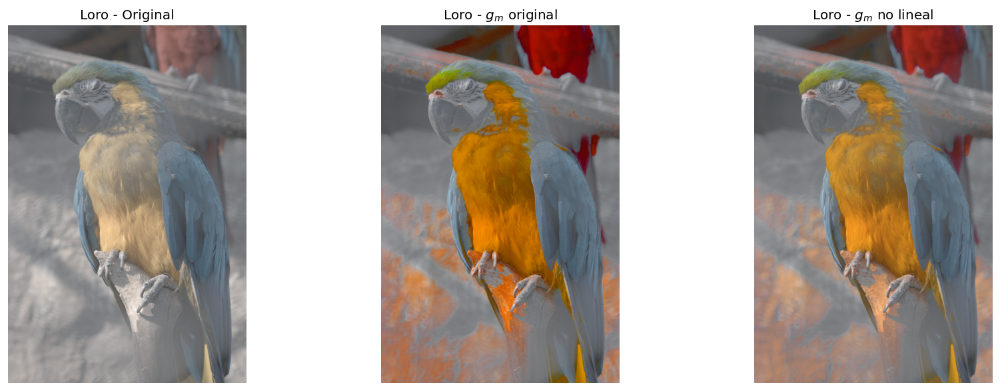

In [23]:
# Config extrema
config_exploracion = [
    (0, 10.0), 
    (60, 10.0), 
    (110, 1.0), 
    (290, 1.0), 
    (330, 10.0), 
    (360, 10.0)
]

resultado_original = color_saturation(
    img_rgb_1,
    config_exploracion,
    mode='HS'
    )
resultado_suave = color_saturation2(
        img_rgb_1,
        config_exploracion
    )

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(img_rgb_1)
ax[0].set_title(f'Loro - Original')

ax[1].imshow(resultado_original)
ax[1].set_title(f'Loro - $g_m$ original')

ax[2].imshow(resultado_suave)
ax[2].set_title(f'Loro - $g_m$ no lineal')

for axis in ax:
    axis.axis('off')

plt.tight_layout()
plt.savefig(
    os.path.join('results', 'p1', 'adicional.png'),
    dpi=300,
    bbox_inches='tight'
)
plt.show()

**Exploración Adicional: Rediseño No Lineal de \\(g_m\\)**

Para mitigar los artefactos de *clipping* duro provocados por la multiplicación lineal convencional, se implementó una función de amplificación no lineal continua:

$$g_m(S, m) = \frac{S \cdot m(h)}{1 + S \cdot (m(h) - 1)}$$

**Propiedades de la Nueva g_m**
* Garantiza que $g_m(0) = 0$ y $g_m(1) = 1 $ para cualquier $m(h) > 0$ y Si $m(h)=1$, queda $g_m(S)=S$ (comportamiento neutro).
* **Compresión Asintótica:** Para valores $m(h) > 1$, la función presenta una curva cóncava suave que comprime las saturaciones altas sin saturar bruscamente la derivada, evitando discontinuidades en la transición de color.

Al aplicar la configuración extrema m = 10 sobre la imagen del Loro en modo HS:

* **$g_m$ Original (Lineal + Clip):** Produce bordes duros y manchas cromáticas intensas/falsas en áreas neutras iluminadas o grises, debido al truncamiento directo al llegar a S = 1.
* **$g_m$ Suave (Racional):** Mantiene la respuesta dentro de la gama de forma progresiva. Si bien la amplificación extrema sigue produciendo manchas de color en las zonas grises, debido a que igual se amplifica fuertemente residuos mínimos de croma, estas manchas resultan mucho más atenuadas, suaves y mejor integradas.

El diseño no lineal de $g_m$  mejora significativamente la suavidad de las transiciones y elimina el clipping abrupto. Sin embargo, demuestra que multiplicadores masivos m >> 1 siempre tenderán a amplificar el ruido cromático en tonos neutros, independientemente de la suavidad de la función.